In [1]:
import scanpy as sc
import muon
from muon import MuData
import pandas as pd
import numpy as np

In [2]:
adata_atac_scvi = sc.read("/lustre/groups/ml01/workspace/moscot_paper/pancreas_revision/adata_atac_PoissonVI_full.h5ad")
adata_rna_scvi = sc.read("/lustre/groups/ml01/workspace/moscot_paper/pancreas_revision/adata_gex_scVI_full.h5ad")
mudata = muon.read("/lustre/groups/ml01/workspace/moscot_paper/pancreas_revision/scMultiome_Mouse-Islets_NVF_E14-E16_mudata_markedDoublets_mergedPeaks_normalized_rmDoublets.h5mu")

/home/icb/dominik.klein/mambaforge/envs/scvi-tools/lib/python3.11/site-packages/anndata/__init__.py:51: FutureWarning: `anndata.read` is deprecated, use `anndata.read_h5ad` instead. `ad.read` will be removed in mid 2024.
  warnings.warn(
/home/icb/dominik.klein/mambaforge/envs/scvi-tools/lib/python3.11/site-packages/anndata/__init__.py:51: FutureWarning: `anndata.read` is deprecated, use `anndata.read_h5ad` instead. `ad.read` will be removed in mid 2024.
  warnings.warn(
/home/icb/dominik.klein/mambaforge/envs/scvi-tools/lib/python3.11/site-packages/anndata/_core/anndata.py:522: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(
/home/icb/dominik.klein/mambaforge/envs/scvi-tools/lib/python3.11/site-packages/anndata/_core/anndata.py:522: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(


In [3]:
mudata["rna"].obsm["X_scVI"] = adata_rna_scvi.obsm["X_scVI"]
mudata["atac"].obsm["X_poissonvi"] = adata_atac_scvi.obsm["X_poissonvi"]

In [5]:
mudata.write("/lustre/groups/ml01/workspace/moscot_paper/pancreas_revision/mudata_with_embeddings.h5mu")

/home/icb/dominik.klein/mambaforge/envs/scvi-tools/lib/python3.11/site-packages/anndata/_core/anndata.py:1292: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[key] = c


In [2]:
mudata = muon.read("/lustre/groups/ml01/workspace/moscot_paper/pancreas_revision/mudata_with_embeddings.h5mu")

/home/icb/dominik.klein/mambaforge/envs/scvi-tools/lib/python3.11/site-packages/anndata/_core/anndata.py:522: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(
/home/icb/dominik.klein/mambaforge/envs/scvi-tools/lib/python3.11/site-packages/anndata/_core/anndata.py:522: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(


In [3]:
sc.pp.neighbors(mudata["rna"], use_rep="X_scVI", metric='correlation', n_neighbors=int(np.sqrt(mudata.shape[0]) * 0.125))

In [4]:
sc.pp.neighbors(mudata["atac"], use_rep="X_poissonvi", metric='correlation', n_neighbors=int(np.sqrt(mudata.shape[0]) * 0.125))

In [5]:
sc.tl.umap(mudata["rna"])
sc.tl.umap(mudata["atac"])

/home/icb/dominik.klein/mambaforge/envs/scvi-tools/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:371: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/home/icb/dominik.klein/mambaforge/envs/scvi-tools/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:381: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/home/icb/dominik.klein/mambaforge/envs/scvi-tools/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/icb/dominik.klein/mambaforge/envs/scvi-tools/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:371: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/home/icb/dominik.klein/mambaforge/envs/scvi-tools/lib/python3.11/site-packages/scanp

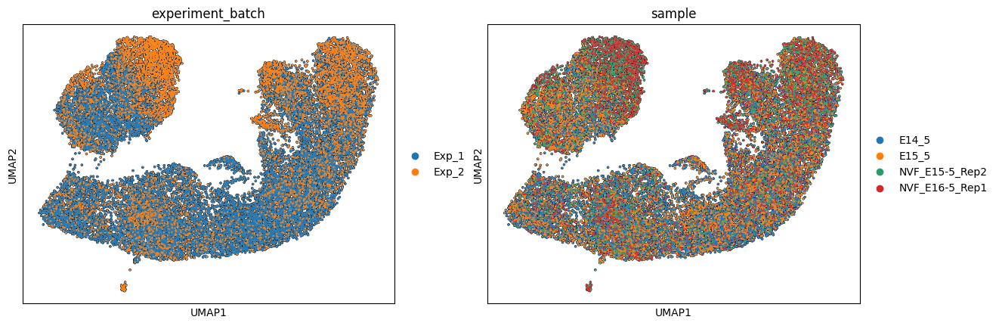

In [6]:
sc.pl.umap(mudata["rna"], color=["experiment_batch", "sample"], size=10, add_outline=True, alpha=1, outline_width=(0.3, 0.0))

/home/icb/dominik.klein/mambaforge/envs/scvi-tools/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:371: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/home/icb/dominik.klein/mambaforge/envs/scvi-tools/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:381: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/home/icb/dominik.klein/mambaforge/envs/scvi-tools/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/icb/dominik.klein/mambaforge/envs/scvi-tools/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:371: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/home/icb/dominik.klein/mambaforge/envs/scvi-tools/lib/python3.11/site-packages/scanp

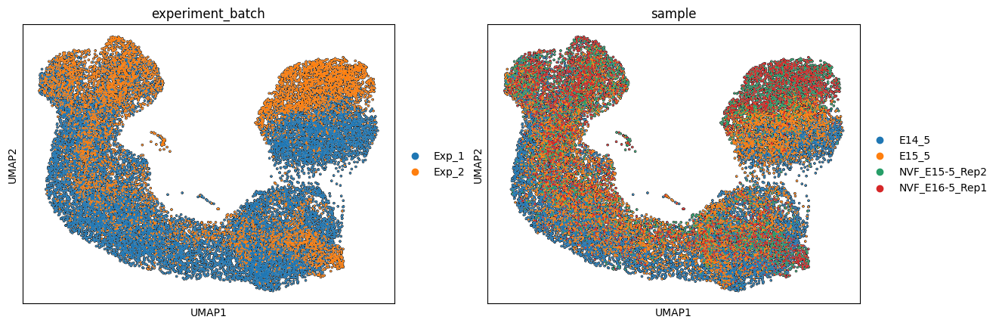

In [7]:
sc.pl.umap(mudata["atac"], color=["experiment_batch", "sample"], size=10, add_outline=True, alpha=1, outline_width=(0.3, 0.0))

In [8]:
sc.tl.leiden(mudata["rna"], resolution=0.5, key_added="leiden_05_rna")
sc.tl.leiden(mudata["atac"], resolution=0.5, key_added="leiden_05_atac")

In [9]:
mudata["rna"].obs["leiden_05_atac"] = mudata["atac"].obs["leiden_05_atac"]
mudata["atac"].obs["leiden_05_rna"] = mudata["rna"].obs["leiden_05_rna"]

/home/icb/dominik.klein/mambaforge/envs/scvi-tools/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:371: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/home/icb/dominik.klein/mambaforge/envs/scvi-tools/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:381: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/home/icb/dominik.klein/mambaforge/envs/scvi-tools/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/icb/dominik.klein/mambaforge/envs/scvi-tools/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:371: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/home/icb/dominik.klein/mambaforge/envs/scvi-tools/lib/python3.11/site-packages/scanp

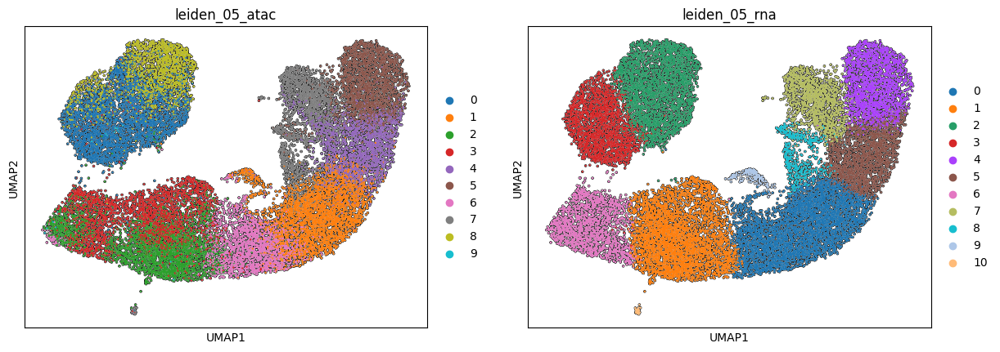

In [10]:
sc.pl.umap(mudata["rna"], color=["leiden_05_atac", "leiden_05_rna"], size=10, add_outline=True, alpha=1, outline_width=(0.3, 0.0))

/home/icb/dominik.klein/mambaforge/envs/scvi-tools/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:371: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/home/icb/dominik.klein/mambaforge/envs/scvi-tools/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:381: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/home/icb/dominik.klein/mambaforge/envs/scvi-tools/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/icb/dominik.klein/mambaforge/envs/scvi-tools/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:371: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/home/icb/dominik.klein/mambaforge/envs/scvi-tools/lib/python3.11/site-packages/scanp

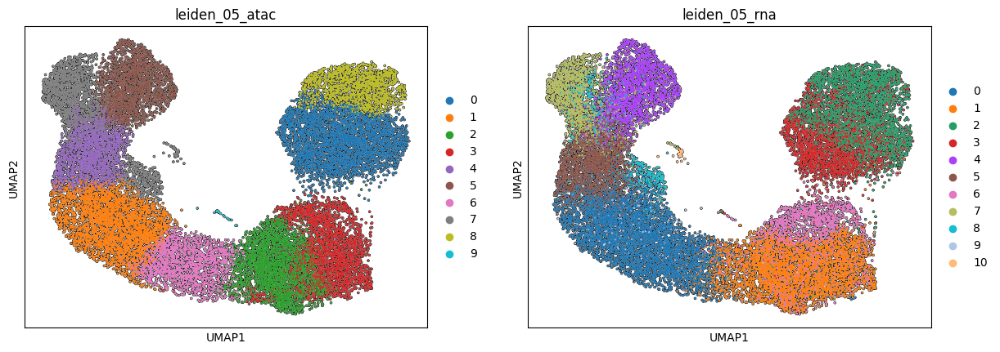

In [11]:
sc.pl.umap(mudata["atac"], color=["leiden_05_atac", "leiden_05_rna"], size=10, add_outline=True, alpha=1, outline_width=(0.3, 0.0))

In [12]:
sc.tl.leiden(mudata["rna"], resolution=1.0, key_added="leiden_1_rna")
sc.tl.leiden(mudata["atac"], resolution=1.0, key_added="leiden_1_atac")

In [13]:
mudata["rna"].obs["leiden_1_atac"] = mudata["atac"].obs["leiden_1_atac"]
mudata["atac"].obs["leiden_1_rna"] = mudata["rna"].obs["leiden_1_rna"]

/home/icb/dominik.klein/mambaforge/envs/scvi-tools/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:371: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/home/icb/dominik.klein/mambaforge/envs/scvi-tools/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:381: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/home/icb/dominik.klein/mambaforge/envs/scvi-tools/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/icb/dominik.klein/mambaforge/envs/scvi-tools/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:371: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/home/icb/dominik.klein/mambaforge/envs/scvi-tools/lib/python3.11/site-packages/scanp

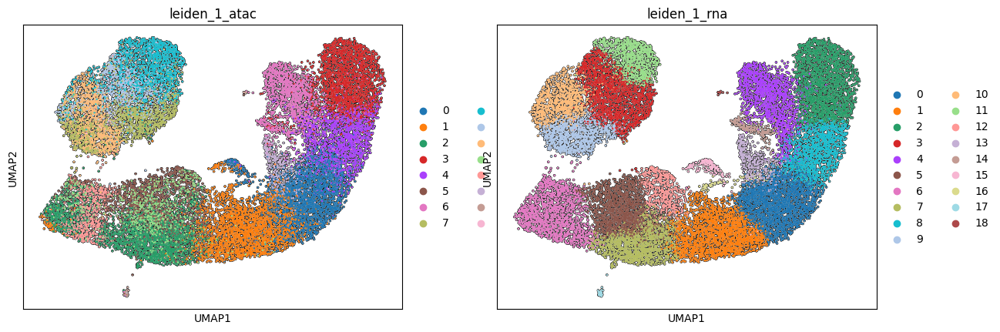

In [14]:
sc.pl.umap(mudata["rna"], color=["leiden_1_atac", "leiden_1_rna"], size=10, add_outline=True, alpha=1, outline_width=(0.3, 0.0))

/home/icb/dominik.klein/mambaforge/envs/scvi-tools/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:371: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/home/icb/dominik.klein/mambaforge/envs/scvi-tools/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:381: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/home/icb/dominik.klein/mambaforge/envs/scvi-tools/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/icb/dominik.klein/mambaforge/envs/scvi-tools/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:371: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/home/icb/dominik.klein/mambaforge/envs/scvi-tools/lib/python3.11/site-packages/scanp

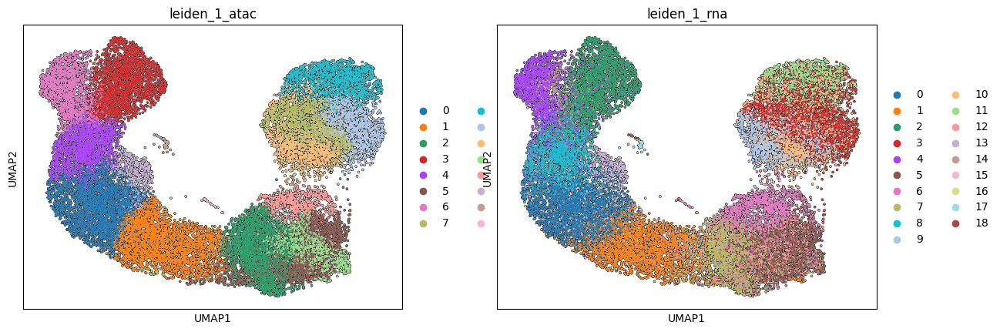

In [15]:
sc.pl.umap(mudata["atac"], color=["leiden_1_atac", "leiden_1_rna"], size=10, add_outline=True, alpha=1, outline_width=(0.3, 0.0))

In [17]:
muon.pp.neighbors(mudata, metric='correlation',  n_neighbors=int(np.sqrt(mudata.shape[0]) * 0.125))

In [18]:
muon.tl.leiden(mudata, resolution=0.5)

In [19]:
muon.tl.umap(mudata)

In [22]:
mudata.obs["sample"] = mudata["atac"].obs["sample"]
mudata["atac"].obs["leiden_combined"] = mudata.obs["leiden"]
mudata["rna"].obs["leiden_combined"] = mudata.obs["leiden"]

/home/icb/dominik.klein/mambaforge/envs/scvi-tools/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/icb/dominik.klein/mambaforge/envs/scvi-tools/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


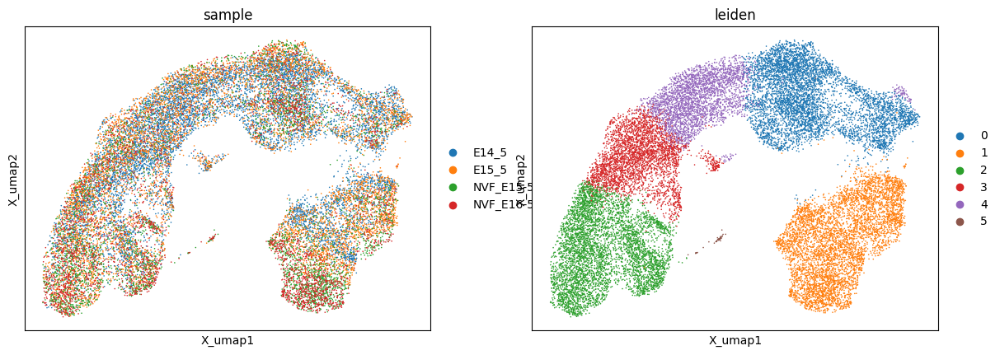

In [24]:
muon.pl.umap(mudata, color=["sample", "leiden"])

/home/icb/dominik.klein/mambaforge/envs/scvi-tools/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/icb/dominik.klein/mambaforge/envs/scvi-tools/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


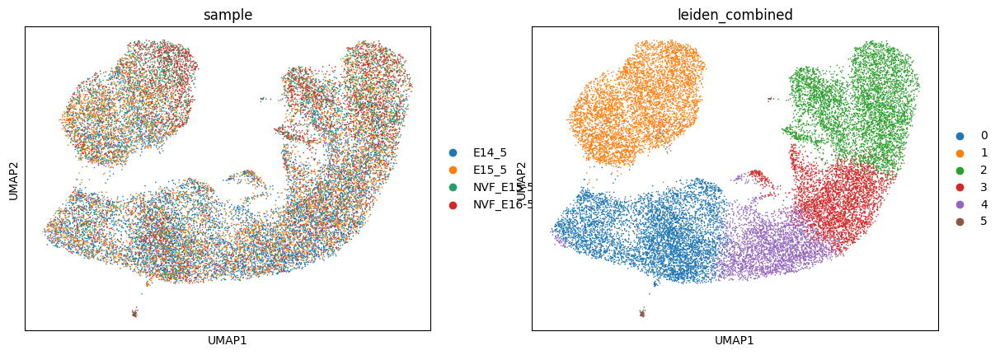

In [27]:
muon.pl.umap(mudata["rna"], color=["sample", "leiden_combined"])

/home/icb/dominik.klein/mambaforge/envs/scvi-tools/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/icb/dominik.klein/mambaforge/envs/scvi-tools/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


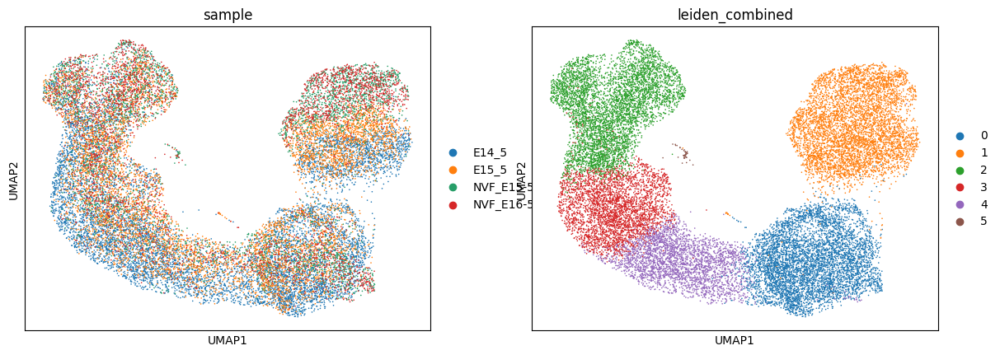

In [29]:
muon.pl.umap(mudata["atac"], color=["sample", "leiden_combined"])

In [30]:
mudata.obs = mudata["rna"].obs.join(mudata["atac"].obs, rsuffix="atac")

/home/icb/dominik.klein/mambaforge/envs/scvi-tools/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:371: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  ax.scatter(
/home/icb/dominik.klein/mambaforge/envs/scvi-tools/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:381: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  ax.scatter(
/home/icb/dominik.klein/mambaforge/envs/scvi-tools/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:371: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/home/icb/dominik.klein/mambaforge/envs/scvi-tools/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:381: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/home/icb/dominik.klein/mambaforge/envs/scvi-tools/lib/python3.11/site-p

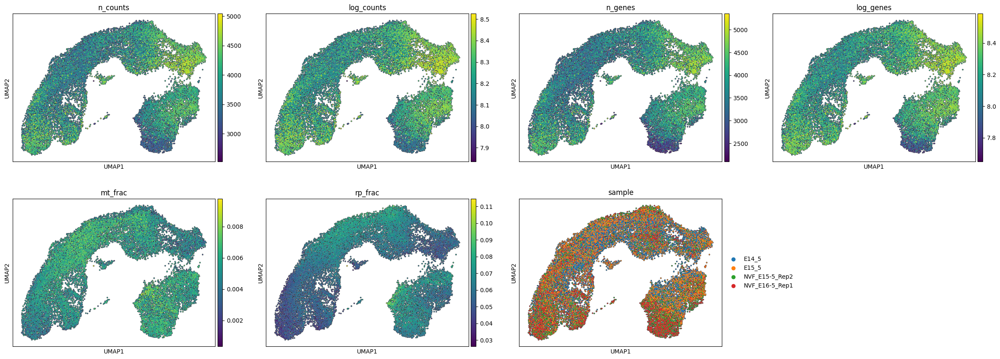

In [34]:
sc.pl.umap(mudata, color=['n_counts',  'log_counts', 'n_genes','log_genes','mt_frac','rp_frac', "sample"], size=10, add_outline=True, alpha=1, outline_width=(0.3, 0.0), ncols=4)


In [37]:
mudata["atac"].obs = mudata.obs

/home/icb/dominik.klein/mambaforge/envs/scvi-tools/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:371: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  ax.scatter(
/home/icb/dominik.klein/mambaforge/envs/scvi-tools/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:381: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  ax.scatter(
/home/icb/dominik.klein/mambaforge/envs/scvi-tools/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:371: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/home/icb/dominik.klein/mambaforge/envs/scvi-tools/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:381: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/home/icb/dominik.klein/mambaforge/envs/scvi-tools/lib/python3.11/site-p

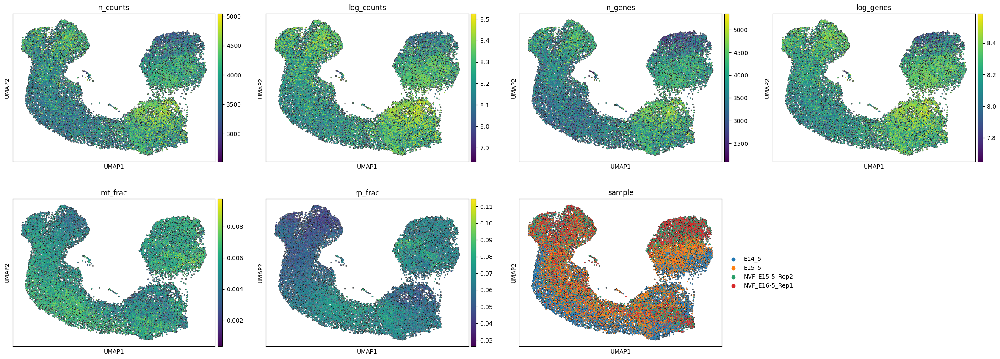

In [40]:
sc.pl.umap(mudata["atac"], color=['n_counts',  'log_counts','n_genes','log_genes','mt_frac','rp_frac', "sample"], size=10, add_outline=True, alpha=1, outline_width=(0.3, 0.0), ncols=4)


/home/icb/dominik.klein/mambaforge/envs/scvi-tools/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:371: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  ax.scatter(
/home/icb/dominik.klein/mambaforge/envs/scvi-tools/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:381: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  ax.scatter(
/home/icb/dominik.klein/mambaforge/envs/scvi-tools/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:371: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/home/icb/dominik.klein/mambaforge/envs/scvi-tools/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:381: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/home/icb/dominik.klein/mambaforge/envs/scvi-tools/lib/python3.11/site-p

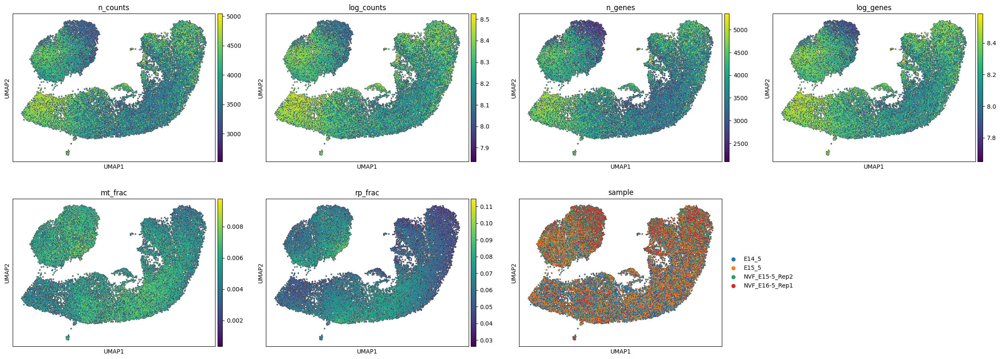

In [42]:
sc.pl.umap(mudata["rna"],color=['n_counts',  'log_counts','n_genes','log_genes','mt_frac','rp_frac', "sample"], size=10, add_outline=True, alpha=1, outline_width=(0.3, 0.0), ncols=4)

### ATAC metrics

In [45]:
mudata["atac"].obs.columns

Index(['sample', 'name', 'stage', 'stage_num', 'int_id', 'seq_id_gex_id',
       'seq_id_atac', 'reporter', 'experiment_batch', 'sequencing_batch',
       'n_counts', 'log_counts', 'n_counts_rank', 'n_genes', 'log_genes',
       'mt_frac', 'rp_frac', 'ambi_frac', 'final_doublets',
       'final_doublets_cat', 'doublet_calls', 'batch', 'size_factors',
       'leiden', 'leiden_05_rna', 'leiden_05_atac', 'leiden_1_rna',
       'leiden_1_atac', 'leiden_combined', 'sampleatac', 'nameatac',
       'stageatac', 'stage_numatac', 'int_idatac', 'seq_id_gex_idatac',
       'seq_id_atacatac', 'reporteratac', 'experiment_batchatac',
       'sequencing_batchatac', 'final_doubletsatac', 'final_doublets_catatac',
       'doublet_callsatac', 'batchatac', 'n_counts_ATAC', 'log_counts_ATAC',
       'n_counts_rank_ATAC', 'n_peaks_ATAC', 'log_peaks_ATAC',
       'nucleosome_signal', 'tss_score', 'leidenatac', 'leiden_05_atacatac',
       'leiden_05_rnaatac', 'leiden_1_atacatac', 'leiden_1_rnaatac',
       

/home/icb/dominik.klein/mambaforge/envs/scvi-tools/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:371: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  ax.scatter(
/home/icb/dominik.klein/mambaforge/envs/scvi-tools/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:381: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  ax.scatter(
/home/icb/dominik.klein/mambaforge/envs/scvi-tools/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:371: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/home/icb/dominik.klein/mambaforge/envs/scvi-tools/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:381: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/home/icb/dominik.klein/mambaforge/envs/scvi-tools/lib/python3.11/site-p

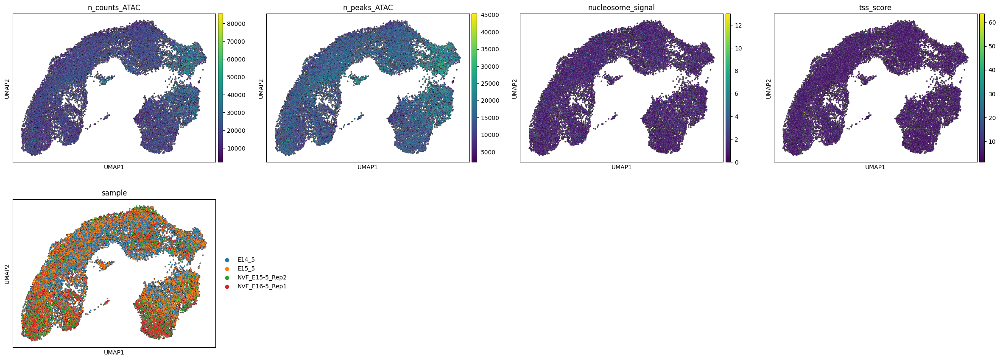

In [46]:
sc.pl.umap(mudata, color=["n_counts_ATAC", "n_peaks_ATAC", "nucleosome_signal", "tss_score", "sample"], size=10, add_outline=True, alpha=1, outline_width=(0.3, 0.0), ncols=4)


### Clustering on differently constructed graphs

In [51]:
muon.tl.leiden(mudata, key_added="leiden_wnn_graph", resolution=1.5)

In [52]:
muon.tl.leiden(mudata["rna"], key_added="leiden_gex_graph", resolution=1)

In [54]:
muon.tl.leiden(mudata["atac"], key_added="leiden_ATAC_graph", resolution=1)

In [55]:
mudata.obs["leiden_gex_graph"] = mudata["rna"].obs["leiden_gex_graph"]
mudata.obs["leiden_ATAC_graph"] = mudata["atac"].obs["leiden_ATAC_graph"]

mudata["rna"].obs["leiden_ATAC_graph"] = mudata["atac"].obs["leiden_ATAC_graph"]
mudata["rna"].obs["leiden_wnn_graph"] = mudata.obs["leiden_wnn_graph"]

mudata["atac"].obs["leiden_gex_graph"] = mudata["rna"].obs["leiden_gex_graph"]
mudata["atac"].obs["leiden_wnn_graph"] = mudata.obs["leiden_wnn_graph"]

Clusters obtained from (WNN / GEX / ATAC) graph on WNN-based UMAP


/home/icb/dominik.klein/mambaforge/envs/scvi-tools/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/icb/dominik.klein/mambaforge/envs/scvi-tools/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/icb/dominik.klein/mambaforge/envs/scvi-tools/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


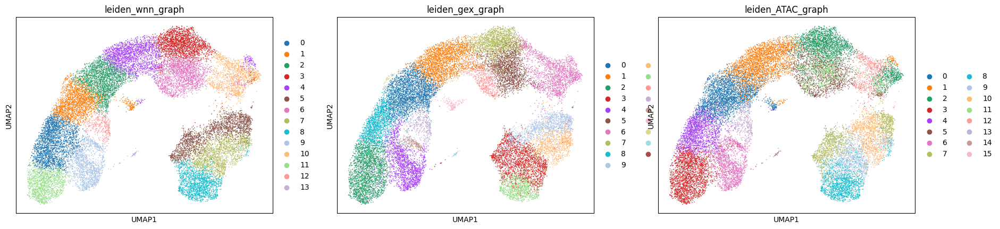

In [56]:
print("Clusters obtained from (WNN / GEX / ATAC) graph on WNN-based UMAP")
sc.pl.umap(mudata, color=["leiden_wnn_graph", "leiden_gex_graph", "leiden_ATAC_graph"])

Clusters obtained from (WNN / GEX / ATAC) graph on GEX-based UMAP


/home/icb/dominik.klein/mambaforge/envs/scvi-tools/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/icb/dominik.klein/mambaforge/envs/scvi-tools/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/icb/dominik.klein/mambaforge/envs/scvi-tools/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


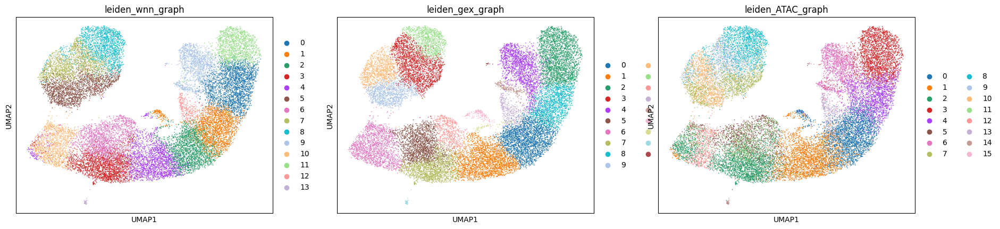

In [58]:
print("Clusters obtained from (WNN / GEX / ATAC) graph on GEX-based UMAP")
sc.pl.umap(mudata["rna"], color=["leiden_wnn_graph", "leiden_gex_graph", "leiden_ATAC_graph"])

Clusters obtained from (WNN / GEX / ATAC) graph on ATAC-based UMAP


/home/icb/dominik.klein/mambaforge/envs/scvi-tools/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/icb/dominik.klein/mambaforge/envs/scvi-tools/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/icb/dominik.klein/mambaforge/envs/scvi-tools/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


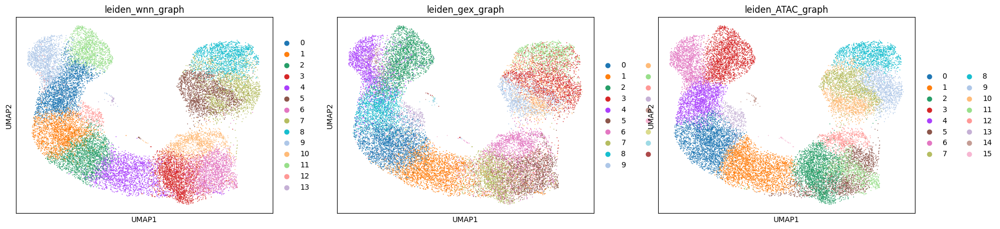

In [59]:
print("Clusters obtained from (WNN / GEX / ATAC) graph on ATAC-based UMAP")
sc.pl.umap(mudata["atac"], color=["leiden_wnn_graph", "leiden_gex_graph", "leiden_ATAC_graph"])

## Try different resolutions on WNN graph

In [60]:
muon.tl.leiden(mudata, resolution=1.4, key_added='leiden_r1.4')
muon.tl.leiden(mudata, resolution=1.5, key_added='leiden_r1.5')
muon.tl.leiden(mudata, resolution=1.6, key_added='leiden_r1.6')
muon.tl.leiden(mudata, resolution=1.7, key_added='leiden_r1.7')
muon.tl.leiden(mudata, resolution=1.8, key_added='leiden_r1.8')
muon.tl.leiden(mudata, resolution=1.9, key_added='leiden_r1.9')
muon.tl.leiden(mudata, resolution=2.0, key_added='leiden_r2.0')
muon.tl.leiden(mudata, resolution=2.1, key_added='leiden_r2.1')
muon.tl.leiden(mudata, resolution=2.2, key_added='leiden_r2.2')
muon.tl.leiden(mudata, resolution=2.3, key_added='leiden_r2.3')
muon.tl.leiden(mudata, resolution=2.4, key_added='leiden_r2.4')
muon.tl.leiden(mudata, resolution=2.5, key_added='leiden_r2.5')

/home/icb/dominik.klein/mambaforge/envs/scvi-tools/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:371: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/home/icb/dominik.klein/mambaforge/envs/scvi-tools/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:381: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/home/icb/dominik.klein/mambaforge/envs/scvi-tools/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/icb/dominik.klein/mambaforge/envs/scvi-tools/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:371: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/home/icb/dominik.klein/mambaforge/envs/scvi-tools/lib/python3.11/site-packages/scanp

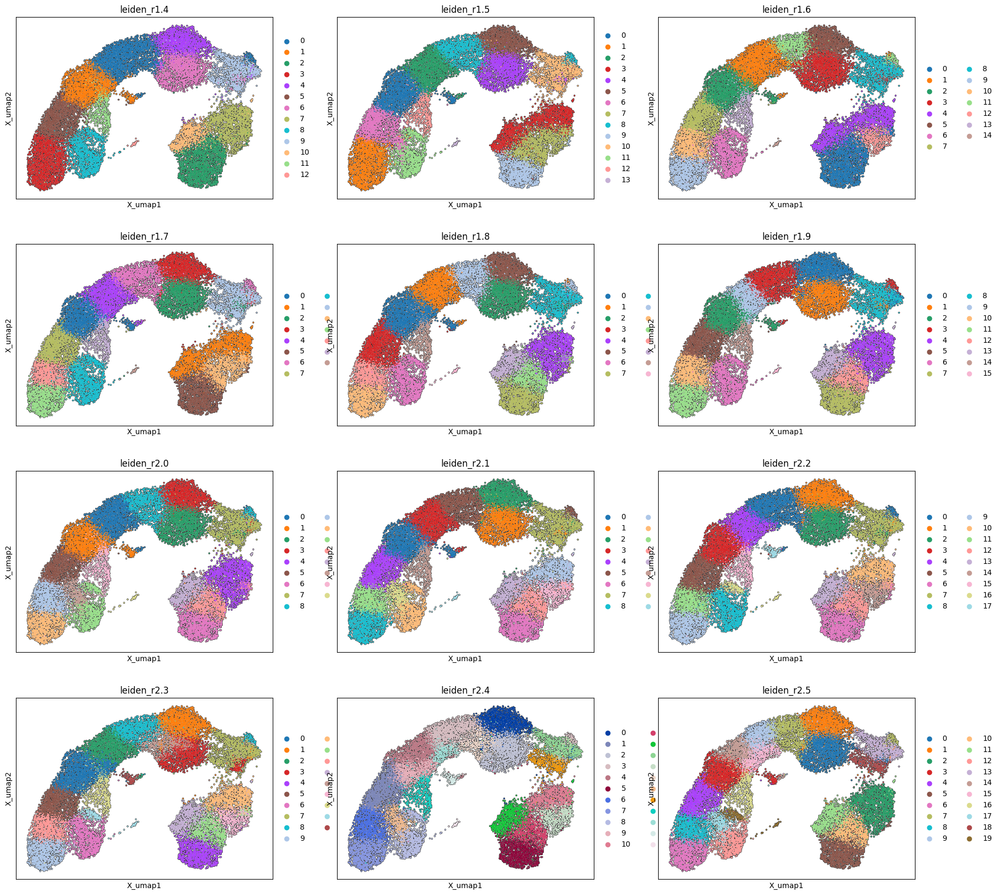

In [61]:
muon.pl.umap(mudata, color=['leiden_r1.4','leiden_r1.5','leiden_r1.6','leiden_r1.7','leiden_r1.8','leiden_r1.9', 'leiden_r2.0', 'leiden_r2.1', 'leiden_r2.2', 'leiden_r2.3', 'leiden_r2.4', 'leiden_r2.5'], size=10, add_outline=True, alpha=1, outline_width=(0.3, 0.0), ncols=3)


In [62]:
mudata.write("/lustre/groups/ml01/workspace/moscot_paper/pancreas_revision/mudata_with_embeddings_before_clustering.h5mu")